### <font color = 'green'> Preparación de entorno

Descarga de librerías

In [ ]:
%%capture
!pip install 'cartopy==0.18.0'
!pip install shapely --no-binary shapely --force
!pip install geopandas
!pip install 'xarray==0.19.0'
!pip install rioxarray

In [ ]:
import warnings # Omitir mensajes de advertencia
warnings.filterwarnings("ignore")

##### CONFIGURACIÓN DE ENTORNO #####
from google.colab import drive     # Conectar Google drive
drive.mount('/content/drive/')

import xarray as xr, pandas as pd, numpy as np, matplotlib.pyplot as plt
import os

path = '/content/drive/MyDrive/Trabajos_UNALM/I.O.A./P4_IOA/'  # Directorio de trabajo (cambiar aquí)
path_sst = '/content/drive/MyDrive/Trabajos_UNALM/I.O.A./P1_IOA/'  # Directorio con los datos (cambiar aquí)
path_data = '/content/drive/MyDrive/Trabajos_UNALM/I.O.A./P2_IOA/'  # Directorio con los datos (cambiar aquí)
os.chdir(path)    # Seleccionar carpeta de trabajo

# https://earthobservatory.nasa.gov/features/ElNino

Mounted at /content/drive/


### <font color = 'green'> Cálculo de índices y correlación

<font color = 'blue' size = 4> Correlación: anomalía de PP por sector vs SST

1. Lectura del dataset CHIRPS 2.0 y cálculo de sus anomalías mensuales

In [ ]:
CHIRPS = xr.open_dataset(path_data + 'CHIRPS_PERU_1991-2021.nc', decode_times = False)
CHIRPS['T'] = pd.date_range('1991-01-01', '2022-10-01', freq = 'MS')

CHIRPS_clim = CHIRPS.sel(T = slice('1991','2020')).groupby('T.month').mean('T')     # Climatología mensual 1991-2010

CHIRPS_anom = CHIRPS.groupby('T.month') - CHIRPS_clim     # Anomalías mensuales
CHIRPS_anom

<xarray.Dataset>
Dimensions:        (T: 382, Y: 450, X: 401)
Coordinates:
  * T              (T) datetime64[ns] 1991-01-01 1991-02-01 ... 2022-10-01
  * Y              (Y) float32 2.475 2.425 2.375 2.325 ... -19.88 -19.92 -19.97
  * X              (X) float32 -85.0 -84.95 -84.9 -84.85 ... -65.1 -65.05 -65.0
    month          (T) int64 1 2 3 4 5 6 7 8 9 10 11 ... 12 1 2 3 4 5 6 7 8 9 10
Data variables:
    precipitation  (T, Y, X) float32 nan nan nan nan ... -18.14 -18.07 -18.72

2. Anomalía de precipitación promedio por sector

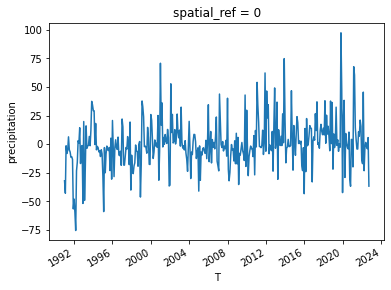

In [ ]:
import geopandas as gpd, rioxarray

sector = gpd.read_file(path + 'SC.zip')

SS = sector.loc[sector.SECTOR.isin(['SIERRA SUR ORIENTAL', 'SIERRA SUR OCCIDENTAL'])]
SSOri = sector.loc[sector['SECTOR'] == 'SIERRA SUR ORIENTAL']
SSOcc = sector.loc[sector['SECTOR'] == 'SIERRA SUR OCCIDENTAL']

CHIRPS_anom = CHIRPS_anom.rio.write_crs(SSOri.geometry.crs)        # Definir sistema de coordenadas de referencia

SSOri_pp = CHIRPS_anom.rio.clip(SSOri.geometry, drop = True).mean(dim = ['X','Y'])  # Anomalía promedio por sector
SSOcc_pp = CHIRPS_anom.rio.clip(SSOcc.geometry, drop = True).mean(dim = ['X','Y'])

SSOri_pp.precipitation.plot()

In [ ]:
SSOri_pp.precipitation.to_dataframe()['precipitation'].to_csv('SSOri_pp.csv', index = True, header = True)
SSOcc_pp.precipitation.to_dataframe()['precipitation'].to_csv('SSOcc_pp.csv', index = True, header = True)

3. Lectura del dataset HadSST y cálculo de sus anomalías mensuales

In [ ]:
import xarray as xr, pandas as pd, numpy as np

sst = xr.open_dataset(path_sst + 'HadISST_sst.nc', drop_variables = ['time_bnds'])  # https://www.metoffice.gov.uk/hadobs/hadsst4/
sst = xr.where(sst == -1000., np.nan, sst)                              # Filtrado de NaN = -1000.
sst['time'] = pd.date_range('1870-01-01', '2022-02-01', freq = 'M')     # Reemplazar time por un pandas.DateTimeIndex

sst_clim = sst.sel(time = slice('1991-01-31T00:00:00.000000000','2020-12-31T00:00:00.000000000'))\
                .groupby('time.month').mean('time')     # Climatología 1991-2020

sst_anom = sst.groupby('time.month') - sst_clim     # Anomalías
sst_anom

<xarray.Dataset>
Dimensions:    (time: 1825, latitude: 180, longitude: 360)
Coordinates:
  * time       (time) datetime64[ns] 1870-01-31 1870-02-28 ... 2022-01-31
  * latitude   (latitude) float32 89.5 88.5 87.5 86.5 ... -87.5 -88.5 -89.5
  * longitude  (longitude) float32 -179.5 -178.5 -177.5 ... 177.5 178.5 179.5
    month      (time) int64 1 2 3 4 5 6 7 8 9 10 11 ... 3 4 5 6 7 8 9 10 11 12 1
Data variables:
    sst        (time, latitude, longitude) float32 nan nan nan ... nan nan nan

4. Coeficiente de correlación de Spearman

In [ ]:
def Spearman_corr(x,y):
    from scipy.stats import spearmanr
    r,p = spearmanr(x,y, nan_policy = 'omit')
    return r

def Spearman_sig(x, y, alpha = 0.05):
    from scipy.stats import spearmanr
    r,p = spearmanr(x,y, nan_policy = 'omit')
    if p <= alpha:  sig = 1
    elif p > alpha: sig = 0
    else:           sig = np.nan
    return sig

ref_period = ['1991','2020']    # Cambiar aquí
SST_corr = sst_anom.sel(time = slice(*ref_period))  # Seleccionar solo el período de referencia.
PP_corr = SSOri_pp.precipitation.to_series()['1991':'2020'].values

SST_corr['Rho_PP_val'] = xr.apply_ufunc(Spearman_corr,
                                        SST_corr.sst,
                                        PP_corr,
                                        input_core_dims = [['time'],['time']],
                                        vectorize = True)

SST_corr['Rho_PP_sig'] = xr.apply_ufunc(Spearman_sig,
                                        SST_corr.sst,
                                        PP_corr,
                                        # input_core_dims = [['time'],['time']],
                                        vectorize = True)

SST_corr

# https://www.martinjung.eu/post/2018_xarrayregression/

In [ ]:
SSOri.geometry.values[0]

In [ ]:
SSOcc.geometry.values[0]

### <font color = 'green'> Análisis por compuestos: precipitación en el Perú durante eventos ENSO

0. Identificar eventos [ene 1981 - nov 2022] para los composites

In [ ]:
ONI_NCEP = pd.read_csv('https://psl.noaa.gov/data/correlation/oni.data', header = None, sep = '\s+', skiprows = 1, skipfooter = 8,
                        index_col = [0], na_values = [-99.9])
ONI_NCEP = ONI_NCEP.stack()
ONI_NCEP.index = pd.date_range('1950-01', periods = ONI_NCEP.shape[0], freq = 'MS')
ONI_NCEP = ONI_NCEP['1981':'2022-11'].round(1)
ONI_NCEP

1981-01-01   -0.3
1981-02-01   -0.5
1981-03-01   -0.5
1981-04-01   -0.4
1981-05-01   -0.3
             ... 
2022-06-01   -0.9
2022-07-01   -0.8
2022-08-01   -0.9
2022-09-01   -1.0
2022-10-01   -1.0
Freq: MS, Length: 502, dtype: float64

In [ ]:
import numba
@numba.njit
def shift5_numba(arr, num, fill_value=np.nan):
    result = np.empty_like(arr)
    if num > 0:
        result[:num] = fill_value
        result[num:] = arr[:-num]
    elif num < 0:
        result[num:] = fill_value
        result[:num] = arr[-num:]
    else:
        result[:] = arr
    return result

def Event_type(array):
    if all(array >= 0.5):       type_o = 'EN'
    elif all(array <= -0.5):    type_o = 'LN'
    else:                       type_o = 'Normal'
    return type_o

ENSO_class = np.where(ONI_NCEP >= 0.5, 1, np.where(ONI_NCEP <= -0.5, -1, np.where((-0.5 < ONI_NCEP) & (ONI_NCEP < 0.5), 0, np.nan)))

start_ = (ENSO_class != shift5_numba(ENSO_class.astype(float), 1, np.nan)) & (~np.isnan(ENSO_class))  # Marca el final de una nueva secuenca al tener el día anterior != al de hoy
start_idx = np.arange(len(ENSO_class))[start_]         # Índice del inicio de cada ola

groups_ = np.split(ONI_NCEP, start_idx, axis = 0)     # Grupos de categorías consecutivas
groups_ = tuple(i for i in groups_[1:] if np.isnan(i)[0] != True)   # Eliminar los grupos que empiecen con nan
groups_ = tuple(i[~np.isnan(i)] for i in groups_)                   # Eliminar los nan internos en los grupos

idx_EN = pd.to_datetime([])
idx_LN = pd.to_datetime([])
for g in groups_:
    if len(g) >= 5:
        if all(g >=  0.5):    idx_EN = idx_EN.union(g.index)
        elif all(g <= -0.5):  idx_LN = idx_LN.union(g.index)
EN = ONI_NCEP.index.isin(idx_EN)
LN = ONI_NCEP.index.isin(idx_LN)

In [ ]:
# Clasificación basada en: https://ggweather.com/enso/oni.htm

EN_weak = EN & (ONI_NCEP < 1.0)                          # Weak
EN_moderate = EN & (1.0 <= ONI_NCEP) & (ONI_NCEP < 1.5)  # Moderate
EN_strong = EN & (1.5 <= ONI_NCEP) & (ONI_NCEP < 2.0)    # Strong
EN_Strong = EN & (2.0 <= ONI_NCEP)                       # Very strong

LN_weak = (-1.0 < ONI_NCEP) & LN                           # Weak
LN_moderate = (-1.5 < ONI_NCEP) & (ONI_NCEP <= -1.0) & LN  # Moderate
LN_strong = (-2.0 < ONI_NCEP) & (ONI_NCEP <= -1.5) & LN    # Strong
LN_Strong = (ONI_NCEP <= -2.0) & LN                        # Very strong

Normal = ~(EN_weak | EN_moderate | EN_strong | EN_Strong | LN_weak | LN_moderate | LN_strong | LN_Strong)

1. Clasificar precipitación mensual (CHIRPS v2)

In [ ]:
# Data CHRIPS monthly para Perú
# http://iridl.ldeo.columbia.edu/SOURCES/.UCSB/.CHIRPS/.v2p0/.monthly/.global/.precipitation/Y/%282.475N%29%2819.975S%29RANGEEDGES/X/%2885W%29%2865W%29RANGEEDGES/datafiles.html

CHIRPS = xr.open_dataset(path + 'Data/CHIRPSm_PERU.nc', decode_times = False)
CHIRPS['T'] = pd.date_range('1981-01-01', '2022-11-01', freq = 'MS')

CHIRPS_clim = CHIRPS.sel(T = slice('1991','2020')).groupby('T.month').mean('T')  # Climatología mensual 1991-2010

CHIRPS_anom = CHIRPS.groupby('T.month') - CHIRPS_clim     # Anomalías mensuales
CHIRPS_anom

<xarray.Dataset>
Dimensions:        (T: 503, Y: 450, X: 401)
Coordinates:
  * T              (T) datetime64[ns] 1981-01-01 1981-02-01 ... 2022-11-01
  * Y              (Y) float32 2.475 2.425 2.375 2.325 ... -19.88 -19.92 -19.97
  * X              (X) float32 -85.0 -84.95 -84.9 -84.85 ... -65.1 -65.05 -65.0
    month          (T) int64 1 2 3 4 5 6 7 8 9 10 11 ... 1 2 3 4 5 6 7 8 9 10 11
Data variables:
    precipitation  (T, Y, X) float32 nan nan nan nan ... -36.23 -36.85 -38.17

In [ ]:
CHIRPS_ENw = CHIRPS_anom.sel(T = ONI_NCEP[EN_weak].index    )
CHIRPS_ENm = CHIRPS_anom.sel(T = ONI_NCEP[EN_moderate].index)
CHIRPS_ENs = CHIRPS_anom.sel(T = ONI_NCEP[EN_strong].index  )
CHIRPS_ENvs = CHIRPS_anom.sel(T = ONI_NCEP[EN_Strong].index )

CHIRPS_LNw = CHIRPS_anom.sel(T = ONI_NCEP[LN_weak].index    )
CHIRPS_LNm = CHIRPS_anom.sel(T = ONI_NCEP[LN_moderate].index)
CHIRPS_LNs = CHIRPS_anom.sel(T = ONI_NCEP[LN_strong].index  )

CHIRPS_N = CHIRPS_anom.sel(T = ONI_NCEP[Normal].index)   # Normal
CHIRPS_N

<xarray.Dataset>
Dimensions:        (T: 228, Y: 450, X: 401)
Coordinates:
  * T              (T) datetime64[ns] 1981-01-01 1981-02-01 ... 2021-07-01
  * Y              (Y) float32 2.475 2.425 2.375 2.325 ... -19.88 -19.92 -19.97
  * X              (X) float32 -85.0 -84.95 -84.9 -84.85 ... -65.1 -65.05 -65.0
    month          (T) int64 1 2 3 4 5 6 7 8 9 10 11 ... 11 12 1 2 3 4 5 6 7 6 7
Data variables:
    precipitation  (T, Y, X) float32 nan nan nan nan ... -0.4094 -0.6546 -0.7354

2. Calcular composites

In [ ]:
Composite_ENw = CHIRPS_ENw.groupby('T.month').mean(dim = 'T')
Composite_ENm = CHIRPS_ENm.groupby('T.month').mean(dim = 'T')
Composite_ENs = CHIRPS_ENs.groupby('T.month').mean(dim = 'T')
Composite_ENvs = CHIRPS_ENvs.groupby('T.month').mean(dim = 'T')

Composite_LNw = CHIRPS_LNw.groupby('T.month').mean(dim = 'T')
Composite_LNm = CHIRPS_LNm.groupby('T.month').mean(dim = 'T')
Composite_LNs = CHIRPS_LNs.groupby('T.month').mean(dim = 'T')

Composite_N = CHIRPS_N.groupby('T.month').mean(dim = 'T')   # Normal
Composite_N

<xarray.Dataset>
Dimensions:        (Y: 450, X: 401, month: 12)
Coordinates:
  * Y              (Y) float32 2.475 2.425 2.375 2.325 ... -19.88 -19.92 -19.97
  * X              (X) float32 -85.0 -84.95 -84.9 -84.85 ... -65.1 -65.05 -65.0
  * month          (month) int64 1 2 3 4 5 6 7 8 9 10 11 12
Data variables:
    precipitation  (month, Y, X) float32 nan nan nan nan ... 17.43 15.78 17.26

Pendiente: probar significancia del composite (prueba t para diferencia de medias) para determinar diferencias significativas entre el estado medio neutro y del evento.

### <font color = 'green'> Gráficos para el informe

In [ ]:
import matplotlib.pyplot as plt, matplotlib.ticker as mticker,matplotlib.dates as mdates, cartopy.crs as ccrs
from cartopy.feature import BORDERS, OCEAN, LAND
from cartopy.mpl.gridliner import LONGITUDE_FORMATTER, LATITUDE_FORMATTER

projection = ccrs.PlateCarree()
mes = {1:'ENERO',2:'FEBRERO',3:'MARZO',4:'ABRIL',5:'MAYO',6:'JUNIO',
       7:'JULIO',8:'AGOSTO',9:'SETIEMBRE',10:'OCTUBRE',11:'NOVIEMBRE',12:'DICIEMBRE'}
season = {1:'Verano - DEF',2:'Invierno - JJA',3:'Otoño - MAM',4:'Primavera - SON'}

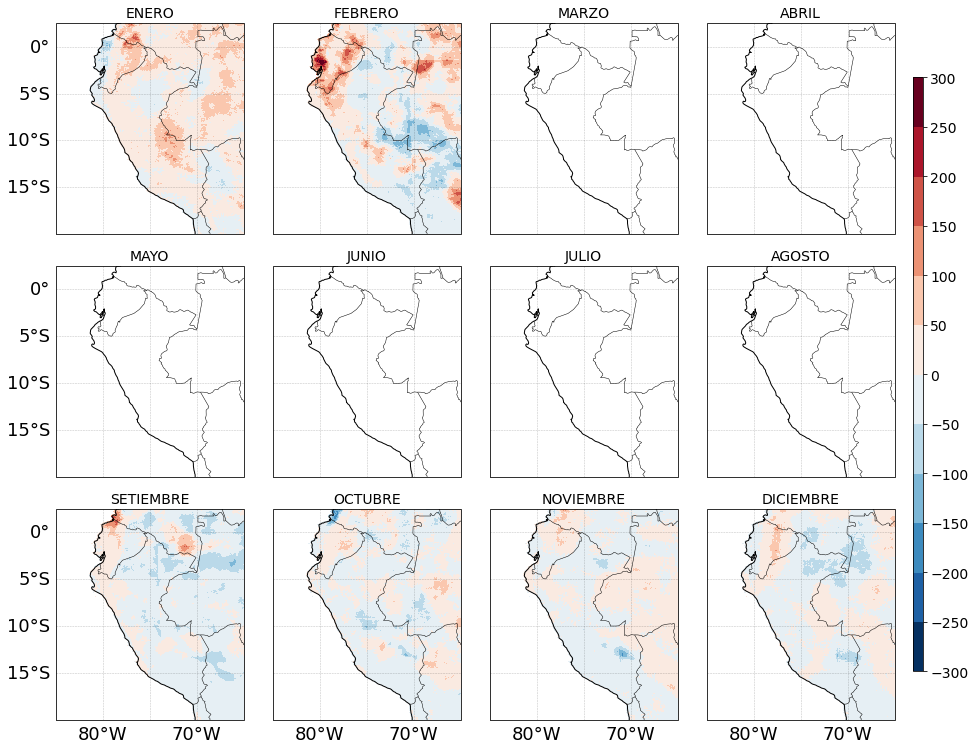

In [ ]:
cmap = plt.get_cmap('RdBu_r', 12)
cmap.set_bad('#FFFFFF')

ds = Composite_LNs              # Cambiar aquí
ds_nan = Composite_ENw * np.nan # este dataset tiene los 12 meses, así que se usará como "modelo"

subplot_kws = dict(projection=ccrs.PlateCarree(), facecolor='white')
fig, Ax = plt.subplots(3, 4, figsize = (15,15), subplot_kw = subplot_kws)

for n, ax in zip(range(1,12+1), Ax.flatten()):
    if n in ds.month.values:
        ds.sel(month = n).precipitation.plot(x='X', y='Y', ax = ax, transform = ccrs.PlateCarree(),
                                            cmap = cmap, vmin = -300, vmax = 300, add_colorbar  = False)
    else:
        ds_nan.sel(month = n).precipitation.plot(x='X', y='Y', ax = ax, transform = ccrs.PlateCarree(),
                                    cmap = cmap, vmin = -300, vmax = 300, add_colorbar  = False)
    
    ax.add_feature(BORDERS, color='black', lw = 0.5, zorder = 2)
    ax.coastlines('50m')
    ax.set_title(mes[n], fontsize = 14)

    grids = ax.axes.gridlines(color='black', alpha=0.25, linestyle='--', linewidth = 0.5,
                              crs=ccrs.PlateCarree(), draw_labels=True)

    grids.xlabels_top = False; grids.ylabels_right = False    # Desactivar labels innecesarios

    if n not in [1,5,9]:        grids.ylabels_left = False
    if n not in [9,10,11,12]:   grids.xlabels_bottom = False

    grids.xlocator = mticker.FixedLocator([x for x in range(-80,-70+5, 5)])  # labels x
    grids.ylocator = mticker.FixedLocator([y for y in range(-20,  0+5, 5)])  # labels y
    grids.xformatter = LONGITUDE_FORMATTER; grids.yformatter = LATITUDE_FORMATTER
    grids.xlabel_style = {'size': 18, 'color': 'k', 'rotation':0}
    grids.ylabel_style = {'size': 18, 'color': 'k', 'rotation':0}
    ax.margins(x = 0, y = 0)

cax = fig.add_axes([0.905,0.3,0.01,0.55])
bounds = [i for i in np.arange(-300, 300+0.00001, 50)]
import matplotlib as mpl
norm = mpl.colors.BoundaryNorm(bounds, cmap.N)
cb = plt.colorbar(mpl.cm.ScalarMappable(norm=norm, cmap=cmap), cax = cax, ticks=bounds, norm=norm)
cb.ax.tick_params(labelsize=14)
cb.set_label('', rotation=270, fontsize=1, labelpad=0)

plt.subplots_adjust(bottom = 0.255, top = 0.9, left = 0.1, right = 0.9, wspace = 0.02, hspace = 0.15)

fig.savefig(path + f'CHIRPS_composites_LNs.png',
                 transparent = False, pad_inches = 0.1, dpi = 400, bbox_inches = 'tight')